## Imports

In [1]:

import random
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import time
import cv2

from numpy import genfromtxt
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_regression
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report, cohen_kappa_score
from sklearn import metrics
from sklearn import tree
from sklearn import preprocessing
from sklearn.model_selection import *
from sklearn.ensemble import *
from sklearn.preprocessing import normalize
import graphviz 
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import SVG

from IPython.display import Image  

#----------------------------------------------------------------

import numpy as np
import matplotlib.pyplot as plt
#set image size
num_pixels = 24


In [2]:
# Importing training  data from CSV files
x_train_import = genfromtxt('x_train_gr_smpl.csv', delimiter=',', skip_header =1)
y_train_import = genfromtxt('y_train_smpl.csv', delimiter=',', skip_header =1 )

In [3]:
# Importing testing data from CSV files
x_test_import = genfromtxt('x_test_gr_smpl.csv', delimiter=',', skip_header =1)
y_test_import = genfromtxt('y_test_smpl.csv', delimiter=',', skip_header =1 )


In [4]:
# Normalisation of pixels
# x_train_import = x_train_import.astype('float')/255
# x_test_import  = x_test_import.astype('float')/255


In [5]:
# Check data has been imported correctly 
print(x_train_import.shape)
print(y_train_import.shape)
print(x_test_import.shape)
print(y_test_import.shape)

(12660, 2304)
(12660,)
(4170, 2304)
(4170,)


## Preprocessing

In [6]:
# Combinging data with labels

y_train_import = y_train_import.reshape(12660,1)
train_data_combined = np.append(x_train_import, y_train_import, axis=1)

y_test_import = y_test_import.reshape(4170,1)
test_data_combined = np.append(x_test_import, y_test_import, axis=1)


In [7]:
# Randomises row order in a reproducable way 
np.random.seed(0)
np.random.shuffle(train_data_combined)
np.random.shuffle(test_data_combined)

In [8]:
#equalize the data so all classes have the same amount of instances (240)

def equilize(data):
    train_combined_equal = []
    for x in range(10):
        count = 0
        #while count < 2000:
        for i in data :
            if i[-1] == x and count < 10000: #can limit max number of instances in each class 
                train_combined_equal.append(i)
                count += 1
        
    train_combined_equal = np.asarray(train_combined_equal)
    np.random.shuffle(train_combined_equal)      
    
    return train_combined_equal

train_combined_equal = equilize(train_data_combined)
print("length:",len(train_combined_equal))

length: 12660


In [9]:
# Split data and lables that have undergone the same randomization process
# x_train = train_combined_equal[:,:-1]
# y_train = train_combined_equal[:, [-1]].reshape(2400,)   
x_train = train_combined_equal[:,:-1]
y_train = train_combined_equal[:, [-1]].reshape(len(train_combined_equal),)   


x_train_all = train_data_combined[:,:-1]
y_train_all = train_data_combined[:, [-1]].reshape(12660,)

x_test = test_data_combined[:,:-1]
y_test = test_data_combined[:, [-1]].reshape(4170,)

#what is the mean of the data
print("train mean:",np.mean(x_train))
print("test mean:",np.mean(x_test))
#shows that test set has been ofset

train mean: 80.957739030685
test mean: 85.48841426858513


In [10]:
#  Reducing the number of attributes using opencv's reduce functionality as shown in the second python Lecture
#  As seen in python lectures: https://vision.hw.ac.uk/webapps/blackboard/content/listContent.jsp?course_id=_94419_1&content_id=_3391865_1
x_train_all = np.apply_along_axis(
        func1d=lambda img: cv2.resize(img.reshape((48,48)), (num_pixels,num_pixels)),
        axis =1, arr = x_train_all).reshape((-1,num_pixels*num_pixels))

x_train = np.apply_along_axis(
        func1d=lambda img: cv2.resize(img.reshape((48,48)), (num_pixels,num_pixels)),
        axis =1, arr = x_train).reshape((-1,num_pixels*num_pixels))

x_test  = np.apply_along_axis(
        func1d=lambda img: cv2.resize(img.reshape((48,48)), (num_pixels,num_pixels)),
        axis =1, arr = x_test).reshape((-1,num_pixels*num_pixels))

#### Data for Q6 and Q7

In [40]:
#split data for q6
x_train_q6, x_test_q6, y_train_q6, y_test_q6 = train_test_split(x_train, y_train, test_size=0.3, stratify=y_train)
#combine test sets
x_test_q6 = np.append(x_test_q6,x_test, axis=0)
y_test_q6 = np.append(y_test_q6,y_test, axis=0)
#split data for q7
x_train_q7, x_test_q7, y_train_q7, y_test_q7 = train_test_split(x_train, y_train, test_size=0.7, stratify=y_train)
#combine test sets
x_test_q7 = np.append(x_test_q7,x_test, axis=0)
y_test_q7 = np.append(y_test_q7,y_test, axis=0)
print("Test data:",x_test.shape)
print("Test data q6:",x_test_q6.shape)
print("Test data q7:",x_test_q7.shape)

print("Train data:",x_train.shape)
print("Train data q6:",x_train_q6.shape)
print("Train data q7:",x_train_q7.shape)

Test data: (4170, 576)
Test data q6: (7968, 576)
Test data q7: (13032, 576)
Train data: (12660, 576)
Train data q6: (8862, 576)
Train data q7: (3798, 576)


In [12]:
x_train_test = np.append(x_train,x_test, axis=0)
y_train_test = np.append(y_train,y_test, axis=0)

#### starndarise data for test

In [13]:
#create method to reduce code
def standardise2(data):
    x_train_norm = []
    for row in data:
        rownew = []
        mean = np.mean(row)

        sd = np.std(row)
        #print(row)
        for i in row:
            j = (i - mean)/sd
            rownew.append(j)
        x_train_norm.append(rownew)
    x_train_norm = np.asarray(x_train_norm)    
    return(x_train_norm)

    
x_train_norm = standardise2(x_train)
x_test_norm = standardise2(x_test)
#check not messed up
print("train shape:",x_train_norm.shape)
print("test shape:",x_test_norm.shape)

train shape: (12660, 576)
test shape: (4170, 576)


## Ten Fold Cross Validation


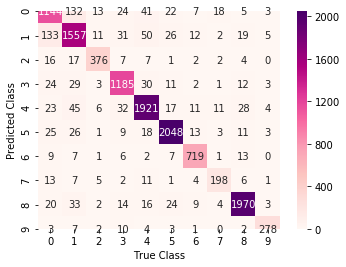

In [14]:
#ten fold on train data
clf = tree.DecisionTreeClassifier()
y_pred = cross_val_predict(clf, x_train, y_train, cv=10)
conf_mat = confusion_matrix(y_train, y_pred)
#confusion matrix
sns.heatmap(conf_mat.T, square=True, annot=True,cmap="RdPu", fmt='.0f', cbar=True)
plt.xlabel('True Class')
plt.ylabel('Predicted Class');

In [15]:
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

         0.0       0.81      0.81      0.81      1410
         1.0       0.84      0.84      0.84      1860
         2.0       0.87      0.90      0.88       420
         3.0       0.91      0.90      0.90      1320
         4.0       0.92      0.91      0.92      2100
         5.0       0.95      0.95      0.95      2160
         6.0       0.94      0.92      0.93       780
         7.0       0.80      0.82      0.81       240
         8.0       0.94      0.95      0.95      2070
         9.0       0.90      0.93      0.91       300

    accuracy                           0.90     12660
   macro avg       0.89      0.89      0.89     12660
weighted avg       0.90      0.90      0.90     12660



## Test overfitting - j48 equivilent

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.346932 to fit


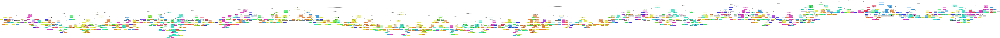

In [18]:
#try standared tree with no limmits 
clf = tree.DecisionTreeClassifier()
#clf.fit(x_train, y_train)
clf.fit(x_train, y_train)
graph = graphviz.Source(tree.export_graphviz(clf, out_file=None,filled=True,rounded=True,class_names=True))  
png_bytes = graph.pipe(format='png')  
name = "overfitting_base_tree.png"
with open(name,'wb') as f:
    f.write(png_bytes)

Image(name)



In [19]:
# graph = graphviz.Source(dot_data) 
# graph.render("overfitting_tree") 
#predict on test set
y_pred_test_data = clf.predict(x_test)
print(classification_report(y_test, y_pred_test_data))

              precision    recall  f1-score   support

         0.0       0.65      0.67      0.66       450
         1.0       0.67      0.77      0.71       630
         2.0       0.80      0.50      0.61       150
         3.0       0.89      0.88      0.89       420
         4.0       0.79      0.78      0.79       690
         5.0       0.86      0.92      0.89       720
         6.0       0.86      0.81      0.83       270
         7.0       0.30      0.28      0.29        60
         8.0       0.90      0.85      0.87       690
         9.0       0.71      0.43      0.54        90

    accuracy                           0.79      4170
   macro avg       0.74      0.69      0.71      4170
weighted avg       0.79      0.79      0.79      4170



In [20]:
cohen_kappa_score(y_test, y_pred_test_data)

0.7550670602040039

In [21]:
#now predict on training set - will be alot better than predictions on test - shows overfitting
y_pred_train_data = clf.predict(x_train)
print(classification_report(y_train, y_pred_train_data))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1410
         1.0       1.00      1.00      1.00      1860
         2.0       1.00      1.00      1.00       420
         3.0       1.00      1.00      1.00      1320
         4.0       1.00      1.00      1.00      2100
         5.0       1.00      1.00      1.00      2160
         6.0       1.00      1.00      1.00       780
         7.0       1.00      1.00      1.00       240
         8.0       1.00      1.00      1.00      2070
         9.0       1.00      1.00      1.00       300

    accuracy                           1.00     12660
   macro avg       1.00      1.00      1.00     12660
weighted avg       1.00      1.00      1.00     12660



In [22]:
#try standared tree with no limmits 
clf = tree.DecisionTreeClassifier()
#clf.fit(x_train, y_train)
clf.fit(x_train_all, y_train_all)
graph = graphviz.Source(tree.export_graphviz(clf, out_file=None,filled=True,rounded=True,class_names=True))  
png_bytes = graph.pipe(format='png')  
name = "overfitting_base_tree.png"
with open(name,'wb') as f:
    f.write(png_bytes)

Image(name)
y_pred_test_data = clf.predict(x_test)
print(classification_report(y_test, y_pred_test_data))

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.344159 to fit


              precision    recall  f1-score   support

         0.0       0.63      0.67      0.65       450
         1.0       0.70      0.74      0.72       630
         2.0       0.74      0.51      0.60       150
         3.0       0.90      0.85      0.88       420
         4.0       0.78      0.79      0.78       690
         5.0       0.85      0.94      0.89       720
         6.0       0.78      0.80      0.79       270
         7.0       0.29      0.23      0.26        60
         8.0       0.89      0.83      0.86       690
         9.0       0.61      0.42      0.50        90

    accuracy                           0.78      4170
   macro avg       0.72      0.68      0.69      4170
weighted avg       0.78      0.78      0.78      4170



#### limit fitting

In [23]:
#try and limit overfitting
clf_list = []
split = (0.02, 0.015, 0.01, 0.008, 0.006, 0.004,0.002, 0.001)
for x in split:
    clf_smpl_splt = tree.DecisionTreeClassifier(min_samples_split = x)
    clf_smpl_splt.fit(x_train, y_train)
    graph = graphviz.Source(tree.export_graphviz(clf_smpl_splt, out_file=None,filled=True,rounded=True,class_names=True)) 
    clf_list.append( clf_smpl_splt)
    
    png_bytes = graph.pipe(format='png')  
    name = "overfitting_tree_"+str(x)+ ".png"
    with open(name,'wb') as f:
        f.write(png_bytes)
    


Image("overfitting_tree_"+str(0.001)+ ".png")

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.705638 to fit
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.538647 to fit



 
 

next model, with split = 0.02
on test:
               precision    recall  f1-score   support

         0.0       0.67      0.51      0.58       450
         1.0       0.53      0.75      0.63       630
         2.0       0.47      0.55      0.50       150
         3.0       0.87      0.75      0.80       420
         4.0       0.76      0.69      0.72       690
         5.0       0.82      0.92      0.87       720
         6.0       0.86      0.64      0.73       270
         7.0       0.05      0.02      0.03        60
         8.0       0.79      0.75      0.77       690
         9.0       0.24      0.23      0.24        90

    accuracy                           0.71      4170
   macro avg       0.61      0.58      0.59      4170
weighted avg       0.72      0.71      0.71      4170



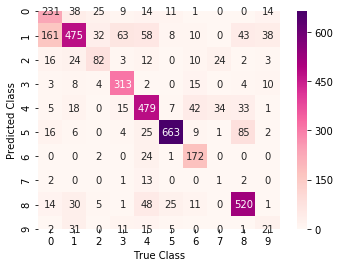

on train:
               precision    recall  f1-score   support

         0.0       0.76      0.61      0.68      1410
         1.0       0.66      0.80      0.72      1860
         2.0       0.51      0.81      0.62       420
         3.0       0.86      0.76      0.81      1320
         4.0       0.86      0.84      0.85      2100
         5.0       0.92      0.90      0.91      2160
         6.0       0.90      0.70      0.79       780
         7.0       0.66      0.18      0.29       240
         8.0       0.79      0.88      0.84      2070
         9.0       0.56      0.50      0.53       300

    accuracy                           0.79     12660
   macro avg       0.75      0.70      0.70     12660
weighted avg       0.80      0.79      0.79     12660


 
 

next model, with split = 0.015
on test:
               precision    recall  f1-score   support

         0.0       0.68      0.54      0.60       450
         1.0       0.55      0.73      0.63       630
         2.0       0

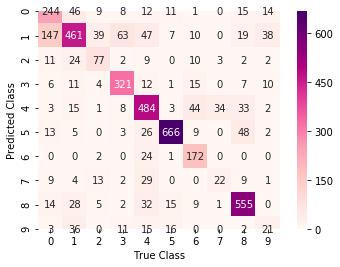

on train:
               precision    recall  f1-score   support

         0.0       0.79      0.66      0.72      1410
         1.0       0.70      0.81      0.75      1860
         2.0       0.60      0.82      0.69       420
         3.0       0.85      0.79      0.82      1320
         4.0       0.87      0.86      0.86      2100
         5.0       0.96      0.89      0.93      2160
         6.0       0.90      0.70      0.79       780
         7.0       0.52      0.69      0.59       240
         8.0       0.87      0.91      0.89      2070
         9.0       0.50      0.64      0.56       300

    accuracy                           0.82     12660
   macro avg       0.76      0.78      0.76     12660
weighted avg       0.83      0.82      0.82     12660


 
 

next model, with split = 0.01
on test:
               precision    recall  f1-score   support

         0.0       0.61      0.57      0.59       450
         1.0       0.61      0.73      0.67       630
         2.0       0.

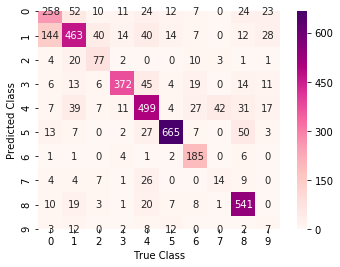

on train:
               precision    recall  f1-score   support

         0.0       0.78      0.73      0.76      1410
         1.0       0.77      0.83      0.80      1860
         2.0       0.68      0.82      0.74       420
         3.0       0.82      0.89      0.85      1320
         4.0       0.86      0.88      0.87      2100
         5.0       0.96      0.90      0.93      2160
         6.0       0.97      0.82      0.89       780
         7.0       0.69      0.68      0.69       240
         8.0       0.93      0.91      0.92      2070
         9.0       0.58      0.64      0.61       300

    accuracy                           0.85     12660
   macro avg       0.81      0.81      0.81     12660
weighted avg       0.86      0.85      0.85     12660


 
 

next model, with split = 0.008
on test:
               precision    recall  f1-score   support

         0.0       0.62      0.61      0.62       450
         1.0       0.64      0.75      0.69       630
         2.0       0

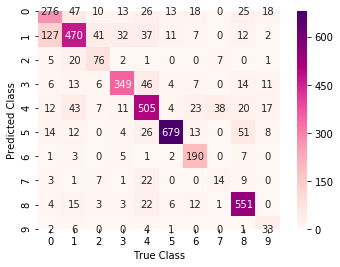

on train:
               precision    recall  f1-score   support

         0.0       0.81      0.77      0.79      1410
         1.0       0.81      0.85      0.83      1860
         2.0       0.75      0.85      0.80       420
         3.0       0.84      0.89      0.86      1320
         4.0       0.88      0.90      0.89      2100
         5.0       0.94      0.93      0.93      2160
         6.0       0.96      0.83      0.89       780
         7.0       0.82      0.68      0.74       240
         8.0       0.96      0.93      0.94      2070
         9.0       0.79      0.77      0.78       300

    accuracy                           0.87     12660
   macro avg       0.86      0.84      0.85     12660
weighted avg       0.88      0.87      0.87     12660


 
 

next model, with split = 0.006
on test:
               precision    recall  f1-score   support

         0.0       0.60      0.68      0.64       450
         1.0       0.67      0.72      0.70       630
         2.0       0

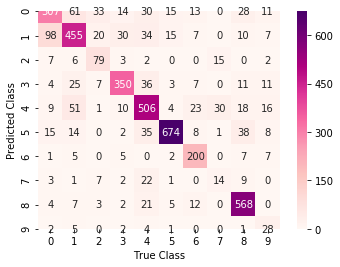

on train:
               precision    recall  f1-score   support

         0.0       0.82      0.82      0.82      1410
         1.0       0.85      0.87      0.86      1860
         2.0       0.77      0.91      0.84       420
         3.0       0.87      0.92      0.89      1320
         4.0       0.90      0.91      0.90      2100
         5.0       0.94      0.94      0.94      2160
         6.0       0.95      0.88      0.91       780
         7.0       0.82      0.68      0.74       240
         8.0       0.97      0.94      0.96      2070
         9.0       0.88      0.77      0.82       300

    accuracy                           0.89     12660
   macro avg       0.88      0.86      0.87     12660
weighted avg       0.90      0.89      0.89     12660


 
 

next model, with split = 0.004
on test:
               precision    recall  f1-score   support

         0.0       0.60      0.71      0.65       450
         1.0       0.72      0.71      0.72       630
         2.0       0

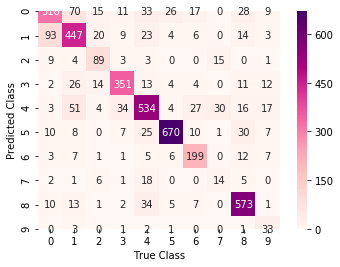

on train:
               precision    recall  f1-score   support

         0.0       0.82      0.87      0.84      1410
         1.0       0.90      0.88      0.89      1860
         2.0       0.85      0.94      0.89       420
         3.0       0.88      0.93      0.91      1320
         4.0       0.91      0.93      0.92      2100
         5.0       0.96      0.95      0.96      2160
         6.0       0.92      0.90      0.91       780
         7.0       0.88      0.68      0.76       240
         8.0       0.97      0.95      0.96      2070
         9.0       0.97      0.77      0.86       300

    accuracy                           0.91     12660
   macro avg       0.91      0.88      0.89     12660
weighted avg       0.91      0.91      0.91     12660


 
 

next model, with split = 0.002
on test:
               precision    recall  f1-score   support

         0.0       0.64      0.69      0.66       450
         1.0       0.71      0.75      0.73       630
         2.0       0

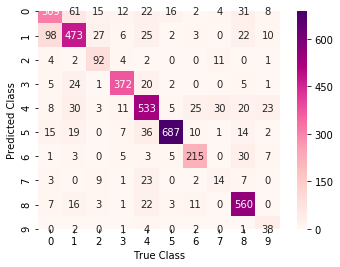

on train:
               precision    recall  f1-score   support

         0.0       0.89      0.93      0.91      1410
         1.0       0.95      0.93      0.94      1860
         2.0       0.92      0.95      0.93       420
         3.0       0.94      0.95      0.94      1320
         4.0       0.95      0.95      0.95      2100
         5.0       0.96      0.97      0.97      2160
         6.0       0.95      0.93      0.94       780
         7.0       0.87      0.83      0.85       240
         8.0       0.98      0.96      0.97      2070
         9.0       0.99      0.93      0.96       300

    accuracy                           0.95     12660
   macro avg       0.94      0.93      0.94     12660
weighted avg       0.95      0.95      0.95     12660


 
 

next model, with split = 0.001
on test:
               precision    recall  f1-score   support

         0.0       0.59      0.70      0.64       450
         1.0       0.70      0.75      0.72       630
         2.0       0

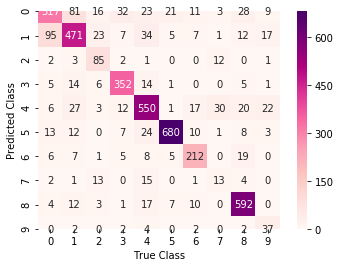

on train:
               precision    recall  f1-score   support

         0.0       0.92      0.97      0.94      1410
         1.0       0.96      0.95      0.96      1860
         2.0       0.97      0.97      0.97       420
         3.0       0.97      0.96      0.96      1320
         4.0       0.97      0.97      0.97      2100
         5.0       0.98      0.98      0.98      2160
         6.0       0.96      0.97      0.97       780
         7.0       0.96      0.90      0.93       240
         8.0       0.99      0.98      0.98      2070
         9.0       0.99      0.94      0.96       300

    accuracy                           0.97     12660
   macro avg       0.97      0.96      0.96     12660
weighted avg       0.97      0.97      0.97     12660



In [24]:
i = 0
for clf_smpl_splt in clf_list:
    #predict on test and training data again
    y_pred_test_data_splt = clf_smpl_splt.predict(x_test)
    y_pred_train_data_splt = clf_smpl_splt.predict(x_train)
    # results on test close to results without limit
    print("\n \n \n")
    print("next model, with split =",split[i])
    print("on test:\n",classification_report(y_test, y_pred_test_data_splt))
    conf_mat = confusion_matrix(y_test, y_pred_test_data_splt)
    sns.heatmap(conf_mat.T, square=True, annot=True,cmap="RdPu", fmt='.0f', cbar=True)
    plt.xlabel('True Class')
    plt.ylabel('Predicted Class');
    plt.show()
    #shows overfitting
    print("on train:\n",classification_report(y_train, y_pred_train_data_splt))
    i +=1

In [25]:
#try and limit overfitting a diffrent way
clf_list2 = []
for x in range(5,13):#below five layes terrible results so dont show
    clf_smpl_splt = tree.DecisionTreeClassifier(max_depth = x)
    clf_smpl_splt.fit(x_train, y_train)
    graph = graphviz.Source(tree.export_graphviz(clf_smpl_splt, out_file=None,filled=True,rounded=True,class_names=True)) 
    clf_list2.append( clf_smpl_splt)
    
    png_bytes = graph.pipe(format='png')  
    name = "overfitting_tree_depth_"+str(x)+ ".png"
    with open(name,'wb') as f:
        f.write(png_bytes)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.791512 to fit
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.654934 to fit
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.525525 to fit
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.466547 to fit



 
 

next model, with depth: 5
on test:
               precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       450
         1.0       0.32      0.57      0.41       630
         2.0       0.23      0.15      0.18       150
         3.0       0.85      0.47      0.61       420
         4.0       0.51      0.54      0.52       690
         5.0       0.69      0.75      0.72       720
         6.0       1.00      0.39      0.56       270
         7.0       0.00      0.00      0.00        60
         8.0       0.45      0.70      0.54       690
         9.0       0.39      0.08      0.13        90

    accuracy                           0.50      4170
   macro avg       0.44      0.36      0.37      4170
weighted avg       0.49      0.50      0.47      4170



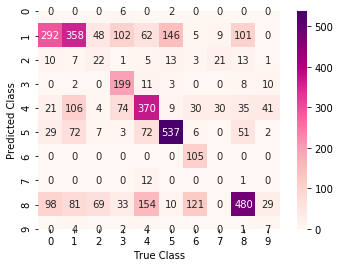

on train:
               precision    recall  f1-score   support

         0.0       0.40      0.01      0.02      1410
         1.0       0.33      0.63      0.44      1860
         2.0       0.27      0.25      0.26       420
         3.0       0.93      0.56      0.70      1320
         4.0       0.72      0.63      0.67      2100
         5.0       0.75      0.65      0.70      2160
         6.0       0.99      0.55      0.71       780
         7.0       0.76      0.07      0.12       240
         8.0       0.44      0.79      0.57      2070
         9.0       0.96      0.38      0.54       300

    accuracy                           0.55     12660
   macro avg       0.66      0.45      0.47     12660
weighted avg       0.62      0.55      0.53     12660


 
 

next model, with depth: 6
on test:
               precision    recall  f1-score   support

         0.0       0.70      0.04      0.07       450
         1.0       0.36      0.72      0.48       630
         2.0       0.36  

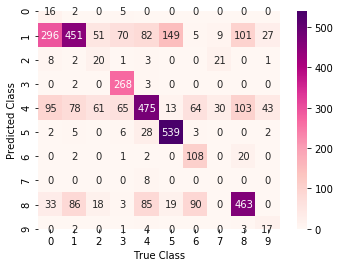

on train:
               precision    recall  f1-score   support

         0.0       0.70      0.02      0.04      1410
         1.0       0.36      0.69      0.47      1860
         2.0       0.46      0.25      0.32       420
         3.0       0.95      0.70      0.80      1320
         4.0       0.49      0.83      0.61      2100
         5.0       0.98      0.65      0.78      2160
         6.0       0.97      0.57      0.72       780
         7.0       1.00      0.07      0.12       240
         8.0       0.69      0.75      0.72      2070
         9.0       0.96      0.45      0.61       300

    accuracy                           0.60     12660
   macro avg       0.76      0.50      0.52     12660
weighted avg       0.71      0.60      0.58     12660


 
 

next model, with depth: 7
on test:
               precision    recall  f1-score   support

         0.0       0.50      0.03      0.05       450
         1.0       0.39      0.88      0.54       630
         2.0       0.74  

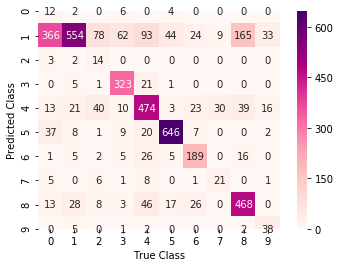

on train:
               precision    recall  f1-score   support

         0.0       0.94      0.02      0.05      1410
         1.0       0.37      0.87      0.52      1860
         2.0       0.79      0.25      0.39       420
         3.0       0.98      0.74      0.85      1320
         4.0       0.79      0.81      0.80      2100
         5.0       0.86      0.82      0.84      2160
         6.0       0.89      0.85      0.87       780
         7.0       0.51      0.39      0.44       240
         8.0       0.85      0.75      0.79      2070
         9.0       1.00      0.58      0.73       300

    accuracy                           0.69     12660
   macro avg       0.80      0.61      0.63     12660
weighted avg       0.79      0.69      0.67     12660


 
 

next model, with depth: 8
on test:
               precision    recall  f1-score   support

         0.0       0.46      0.41      0.43       450
         1.0       0.46      0.76      0.57       630
         2.0       0.60  

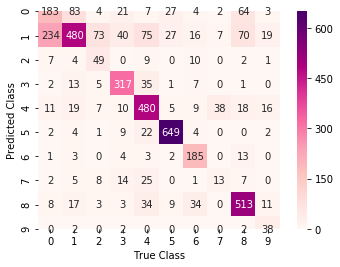

on train:
               precision    recall  f1-score   support

         0.0       0.52      0.48      0.50      1410
         1.0       0.46      0.74      0.57      1860
         2.0       0.69      0.46      0.55       420
         3.0       0.93      0.78      0.85      1320
         4.0       0.85      0.83      0.84      2100
         5.0       0.98      0.82      0.89      2160
         6.0       0.99      0.86      0.92       780
         7.0       0.76      0.72      0.74       240
         8.0       0.86      0.87      0.86      2070
         9.0       1.00      0.58      0.73       300

    accuracy                           0.76     12660
   macro avg       0.81      0.71      0.75     12660
weighted avg       0.79      0.76      0.77     12660


 
 

next model, with depth: 9
on test:
               precision    recall  f1-score   support

         0.0       0.58      0.37      0.45       450
         1.0       0.46      0.77      0.58       630
         2.0       0.67  

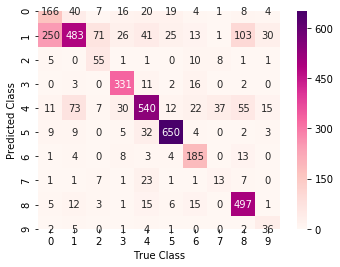

on train:
               precision    recall  f1-score   support

         0.0       0.72      0.44      0.55      1410
         1.0       0.54      0.85      0.66      1860
         2.0       0.84      0.52      0.64       420
         3.0       0.96      0.85      0.90      1320
         4.0       0.76      0.92      0.83      2100
         5.0       0.97      0.84      0.90      2160
         6.0       1.00      0.88      0.94       780
         7.0       0.96      0.72      0.82       240
         8.0       0.95      0.87      0.91      2070
         9.0       0.78      0.72      0.75       300

    accuracy                           0.80     12660
   macro avg       0.85      0.76      0.79     12660
weighted avg       0.83      0.80      0.80     12660


 
 

next model, with depth: 10
on test:
               precision    recall  f1-score   support

         0.0       0.56      0.38      0.45       450
         1.0       0.52      0.76      0.62       630
         2.0       0.70 

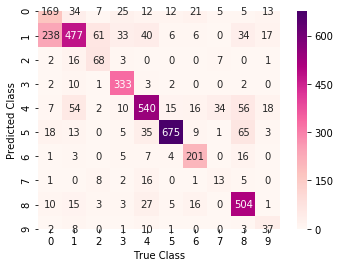

on train:
               precision    recall  f1-score   support

         0.0       0.78      0.51      0.62      1410
         1.0       0.64      0.84      0.72      1860
         2.0       0.82      0.86      0.84       420
         3.0       0.98      0.90      0.94      1320
         4.0       0.81      0.92      0.86      2100
         5.0       0.92      0.94      0.93      2160
         6.0       0.98      0.91      0.94       780
         7.0       0.99      0.72      0.84       240
         8.0       0.96      0.88      0.92      2070
         9.0       0.88      0.72      0.79       300

    accuracy                           0.85     12660
   macro avg       0.88      0.82      0.84     12660
weighted avg       0.86      0.85      0.85     12660


 
 

next model, with depth: 11
on test:
               precision    recall  f1-score   support

         0.0       0.63      0.56      0.59       450
         1.0       0.60      0.76      0.67       630
         2.0       0.79 

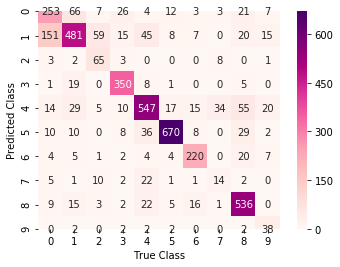

on train:
               precision    recall  f1-score   support

         0.0       0.81      0.69      0.74      1410
         1.0       0.72      0.88      0.80      1860
         2.0       0.97      0.86      0.91       420
         3.0       0.97      0.92      0.94      1320
         4.0       0.85      0.93      0.89      2100
         5.0       0.99      0.94      0.96      2160
         6.0       0.98      0.94      0.96       780
         7.0       0.91      0.85      0.88       240
         8.0       0.96      0.92      0.94      2070
         9.0       0.99      0.78      0.87       300

    accuracy                           0.89     12660
   macro avg       0.91      0.87      0.89     12660
weighted avg       0.90      0.89      0.89     12660


 
 

next model, with depth: 12
on test:
               precision    recall  f1-score   support

         0.0       0.57      0.64      0.60       450
         1.0       0.62      0.75      0.68       630
         2.0       0.82 

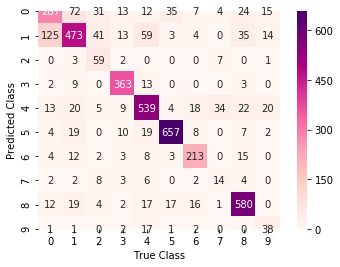

on train:
               precision    recall  f1-score   support

         0.0       0.82      0.86      0.84      1410
         1.0       0.82      0.90      0.86      1860
         2.0       0.99      0.87      0.92       420
         3.0       0.99      0.93      0.96      1320
         4.0       0.94      0.94      0.94      2100
         5.0       1.00      0.95      0.97      2160
         6.0       0.99      0.96      0.97       780
         7.0       0.97      0.90      0.94       240
         8.0       0.94      0.97      0.95      2070
         9.0       1.00      0.83      0.91       300

    accuracy                           0.93     12660
   macro avg       0.94      0.91      0.93     12660
weighted avg       0.93      0.93      0.93     12660



In [26]:
i = 5
for clf_smpl_splt in clf_list2:
    #predict on test and training data again
    y_pred_test_data_splt = clf_smpl_splt.predict(x_test)
    y_pred_train_data_splt = clf_smpl_splt.predict(x_train)
    # results on test close to results without limit
    print("\n \n \n")
    print("next model, with depth:",i)
    print("on test:\n",classification_report(y_test, y_pred_test_data_splt))
    conf_mat = confusion_matrix(y_test, y_pred_test_data_splt)
    sns.heatmap(conf_mat.T, square=True, annot=True,cmap="RdPu", fmt='.0f', cbar=True)
    plt.xlabel('True Class')
    plt.ylabel('Predicted Class');
    plt.show()
    #shows overfitting
    print("on train:\n",classification_report(y_train, y_pred_train_data_splt))
    i +=1

In [27]:
#try another method of limiting fitting
clf_smpl_leaf = tree.DecisionTreeClassifier(min_samples_leaf = 0.0005)
clf_smpl_leaf.fit(x_train, y_train)

graph = graphviz.Source(tree.export_graphviz(clf_smpl_leaf, out_file=None,filled=True,rounded=True,class_names=True)) 
png_bytes = graph.pipe(format='png')  
name = "tree.png"
with open(name,'wb') as f:
    f.write(png_bytes)

Image(name)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.552684 to fit


In [28]:
y_pred_test_data_leaf = clf_smpl_leaf.predict(x_test)
y_pred_train_data_leaf = clf_smpl_leaf.predict(x_train)

print(classification_report(y_test, y_pred_test_data_leaf))

              precision    recall  f1-score   support

         0.0       0.63      0.68      0.65       450
         1.0       0.69      0.76      0.72       630
         2.0       0.81      0.54      0.65       150
         3.0       0.90      0.90      0.90       420
         4.0       0.79      0.80      0.79       690
         5.0       0.89      0.94      0.92       720
         6.0       0.88      0.80      0.84       270
         7.0       0.30      0.23      0.26        60
         8.0       0.92      0.87      0.89       690
         9.0       0.68      0.42      0.52        90

    accuracy                           0.80      4170
   macro avg       0.75      0.70      0.71      4170
weighted avg       0.80      0.80      0.80      4170



In [29]:
print(classification_report(y_train, y_pred_train_data_leaf))

              precision    recall  f1-score   support

         0.0       0.90      0.91      0.91      1410
         1.0       0.92      0.93      0.93      1860
         2.0       0.96      0.94      0.95       420
         3.0       0.93      0.95      0.94      1320
         4.0       0.96      0.96      0.96      2100
         5.0       0.98      0.97      0.97      2160
         6.0       0.96      0.95      0.95       780
         7.0       0.94      0.87      0.90       240
         8.0       0.97      0.97      0.97      2070
         9.0       0.95      0.92      0.94       300

    accuracy                           0.95     12660
   macro avg       0.95      0.94      0.94     12660
weighted avg       0.95      0.95      0.95     12660



### Run with Q6 test Data

In [30]:
#now train with smaller data set for q6 and larger test set
clf2 = tree.DecisionTreeClassifier()
clf2.fit(x_train_q6, y_train_q6)

graph = graphviz.Source(tree.export_graphviz(clf2, out_file=None,filled=True,rounded=True,class_names=True)) 
png_bytes = graph.pipe(format='png')  
name = "tree.png"
with open(name,'wb') as f:
    f.write(png_bytes)

Image(name)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.423982 to fit


In [31]:
#use model to predict for test set
y_pred_test_q6 = clf2.predict(x_test_q6)
print(classification_report(y_test_q6, y_pred_test_q6))

              precision    recall  f1-score   support

         0.0       0.69      0.70      0.69       873
         1.0       0.68      0.73      0.70      1188
         2.0       0.74      0.64      0.69       276
         3.0       0.86      0.85      0.86       816
         4.0       0.80      0.81      0.81      1320
         5.0       0.92      0.91      0.91      1368
         6.0       0.89      0.83      0.86       504
         7.0       0.45      0.58      0.50       132
         8.0       0.89      0.88      0.89      1311
         9.0       0.72      0.59      0.65       180

    accuracy                           0.80      7968
   macro avg       0.76      0.75      0.76      7968
weighted avg       0.81      0.80      0.81      7968



In [32]:
#to check overfitting - predict train set
y_pred_train_q6 = clf2.predict(x_train_q6)
print(classification_report(y_train_q6, y_pred_train_q6))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00       987
         1.0       1.00      1.00      1.00      1302
         2.0       1.00      1.00      1.00       294
         3.0       1.00      1.00      1.00       924
         4.0       1.00      1.00      1.00      1470
         5.0       1.00      1.00      1.00      1512
         6.0       1.00      1.00      1.00       546
         7.0       1.00      1.00      1.00       168
         8.0       1.00      1.00      1.00      1449
         9.0       1.00      1.00      1.00       210

    accuracy                           1.00      8862
   macro avg       1.00      1.00      1.00      8862
weighted avg       1.00      1.00      1.00      8862



### Run with Q7 data

In [33]:
#now train with smaller data set for q7 and larger test set
clf_q7 = tree.DecisionTreeClassifier()
clf_q7.fit(x_train_q7, y_train_q7)
graph = graphviz.Source(tree.export_graphviz(clf_q7, out_file=None,filled=True,rounded=True,class_names=True)) 
png_bytes = graph.pipe(format='png')  
name = "tree.png"
with open(name,'wb') as f:
    f.write(png_bytes)

Image(name)


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.682703 to fit


In [34]:
#use model to predict for test set
y_pred_test_q7 = clf_q7.predict(x_test_q7)
print(classification_report(y_test_q7, y_pred_test_q7))

              precision    recall  f1-score   support

         0.0       0.69      0.71      0.70      1437
         1.0       0.70      0.70      0.70      1932
         2.0       0.65      0.64      0.64       444
         3.0       0.86      0.83      0.85      1344
         4.0       0.83      0.80      0.82      2160
         5.0       0.88      0.91      0.89      2232
         6.0       0.84      0.83      0.84       816
         7.0       0.64      0.59      0.62       228
         8.0       0.86      0.88      0.87      2139
         9.0       0.72      0.68      0.70       300

    accuracy                           0.80     13032
   macro avg       0.77      0.76      0.76     13032
weighted avg       0.80      0.80      0.80     13032



In [35]:
#to check overfitting - predict train set
y_pred_train_q7 = clf2.predict(x_train_q7)
print(classification_report(y_train_q7, y_pred_train_q7))

              precision    recall  f1-score   support

         0.0       0.94      0.93      0.93       423
         1.0       0.94      0.94      0.94       558
         2.0       0.97      0.96      0.96       126
         3.0       0.97      0.97      0.97       396
         4.0       0.98      0.96      0.97       630
         5.0       0.98      0.98      0.98       648
         6.0       0.98      0.98      0.98       234
         7.0       0.86      0.96      0.91        72
         8.0       0.98      0.98      0.98       621
         9.0       0.93      0.96      0.95        90

    accuracy                           0.96      3798
   macro avg       0.95      0.96      0.96      3798
weighted avg       0.96      0.96      0.96      3798



## Random Forest

In [36]:
rnd_forest = RandomForestClassifier(n_estimators = 100)
rnd_forest.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [37]:
y_pred_rf = rnd_forest.predict(x_test)
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

         0.0       0.79      0.62      0.69       450
         1.0       0.70      0.88      0.78       630
         2.0       0.80      0.49      0.61       150
         3.0       0.97      0.95      0.96       420
         4.0       0.87      0.92      0.89       690
         5.0       0.95      0.99      0.97       720
         6.0       0.99      0.96      0.98       270
         7.0       0.38      0.22      0.28        60
         8.0       0.98      0.97      0.97       690
         9.0       1.00      0.66      0.79        90

    accuracy                           0.88      4170
   macro avg       0.84      0.77      0.79      4170
weighted avg       0.88      0.88      0.87      4170



In [38]:
y_pred_rf = rnd_forest.predict(x_train)
print(classification_report(y_train, y_pred_rf))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1410
         1.0       1.00      1.00      1.00      1860
         2.0       1.00      1.00      1.00       420
         3.0       1.00      1.00      1.00      1320
         4.0       1.00      1.00      1.00      2100
         5.0       1.00      1.00      1.00      2160
         6.0       1.00      1.00      1.00       780
         7.0       1.00      1.00      1.00       240
         8.0       1.00      1.00      1.00      2070
         9.0       1.00      1.00      1.00       300

    accuracy                           1.00     12660
   macro avg       1.00      1.00      1.00     12660
weighted avg       1.00      1.00      1.00     12660



## try with standerised data

In [39]:
rnd_forest = RandomForestClassifier(n_estimators = 100)
rnd_forest.fit(x_train_norm, y_train)
y_pred_rf = rnd_forest.predict(x_test_norm)
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

         0.0       0.85      0.69      0.76       450
         1.0       0.77      0.93      0.84       630
         2.0       1.00      0.69      0.81       150
         3.0       0.98      0.98      0.98       420
         4.0       0.95      0.98      0.96       690
         5.0       0.99      0.99      0.99       720
         6.0       0.98      0.94      0.96       270
         7.0       0.93      0.85      0.89        60
         8.0       0.96      0.96      0.96       690
         9.0       1.00      0.88      0.93        90

    accuracy                           0.92      4170
   macro avg       0.94      0.89      0.91      4170
weighted avg       0.93      0.92      0.92      4170

